In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [6]:
def ax_coastlines_country(ax_s):
    ax_s.coastlines(lw=1.5, resolution='110m')
    ax_s.add_feature(cfeature.STATES.with_scale('110m'), zorder=3, linewidth=1.5, edgecolor='g')
    # mask ocean 
    ax_s.add_feature(cfeature.OCEAN, facecolor='white', zorder=1) 

def plot_p10(lat, lon, data_3d, color_map, level_s, title_s):
    # Define the figure and each axis for the 3 rows and 3 columns
    fig, ax = plt.subplots(nrows=2,ncols=5,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(22, 6), dpi=400)

    # axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
    ax=ax.flatten()

    #Loop over all of the members
    for nm in range(1, 11):              
        mm = ax[nm-1].contourf(lon, lat, data_3d[nm-1], 
                      cmap = color_map, extend='both',
                      levels = level_s, 
                      transform=ccrs.PlateCarree())

        # Title each subplot with the name of the model
        ax[nm-1].set_title('member ' + str(nm))
        ax[nm-1].set_extent((ds.lon.values.min(), ds.lon.values.max(), ds.lat.values.min(), ds.lat.values.max()), crs=ccrs.PlateCarree())

        ax[nm-1].coastlines()
        ax_coastlines_country(ax[nm-1])
                 
    # Adjust the location of the subplots on the page to make room for the colorbar
    fig.subplots_adjust(bottom=0.2, top=0.9, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

    # Add a colorbar axis at the bottom of the graph
    cbar_ax = fig.add_axes([0.2, 0.16, 0.6, 0.03])

    # Draw the colorbar
    cbar=fig.colorbar(mm, cax=cbar_ax,orientation='horizontal')

    # Add a big title at the top
    plt.suptitle(title_s)
 

In [3]:
dir_d = '/glade/campaign/mmm/c3we/mingge/QBE/'
n_mem = 10

#### historical (1990-2020)

In [4]:
is_first = True
for nm in range(1, n_mem+1):
    # read data 1990-2014
    flnm = dir_d + 'hailpredictors_lens_'+str(nm).zfill(2)+'_corrected.nc'
    #print(flnm)
    with xr.open_dataset(flnm) as ds:
        #print(ds)
        data_3d = ds.hailpredictors[:,0].sel(year=slice(1990, 2014)).mean(dim=['year'])
        
        if is_first == True:
            # Add new dimension of length ensemble member by expand_dims()
            # expand_dims() makes the result read-only, so we can expand dimensions without copying the original
            # the work-around is by using .copy()
            data_4d = data_3d.expand_dims(dim={'member':n_mem}, axis=0).copy() 
            is_first = False 

        data_4d[nm-1] = data_3d*25.0/31.0
        
    #  read data from 2015-2020
    flnm = dir_d + 'hailpredictors_2015-2024lens_'+str(nm).zfill(2)+'_corrected.nc'
    #print(flnm)
    with xr.open_dataset(flnm) as ds:
        data_3d = ds.hailpredictors[:,0].sel(year=slice(2015, 2020)).mean(dim=['year'])
        data_4d[nm-1] = data_4d[nm-1] + data_3d*6.0/31.0
    

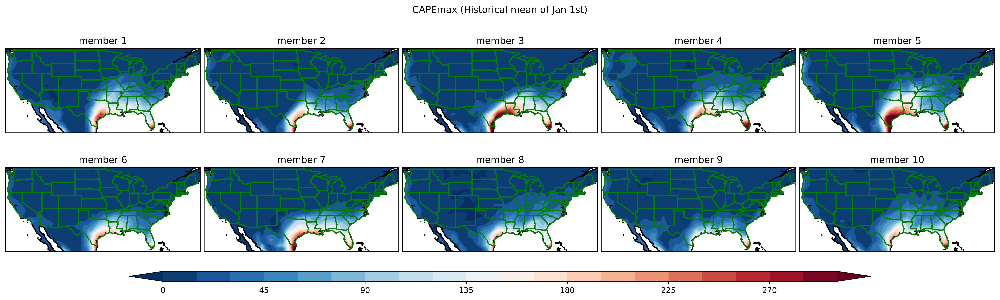

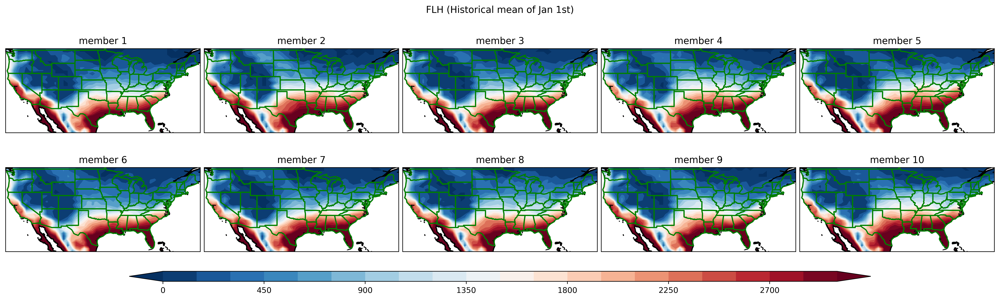

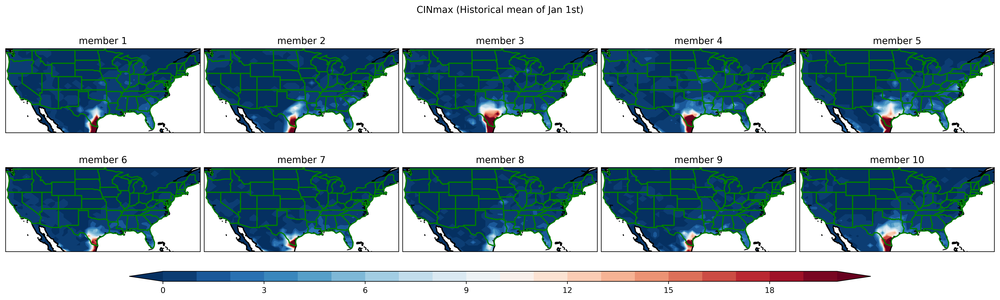

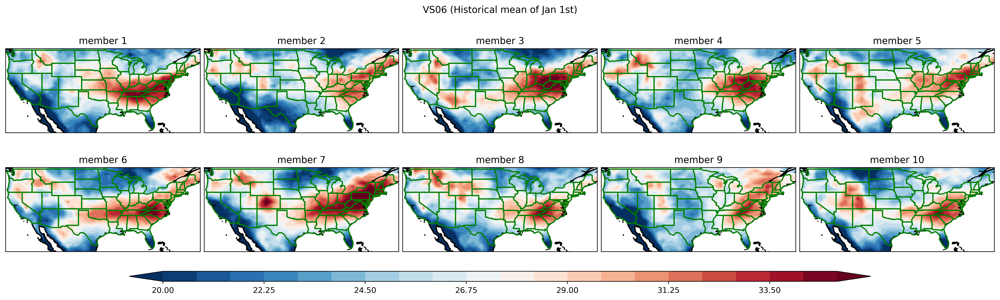

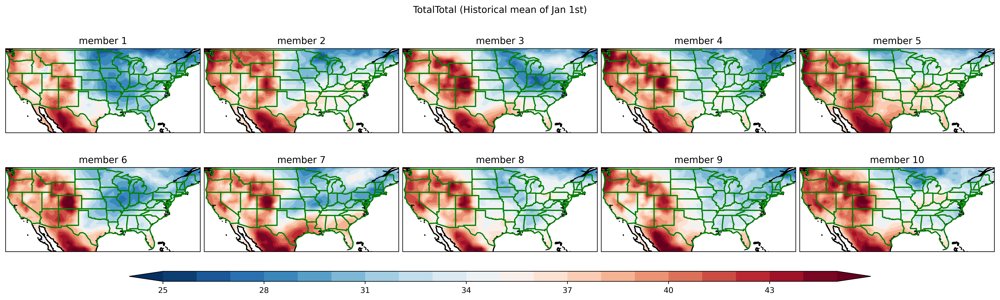

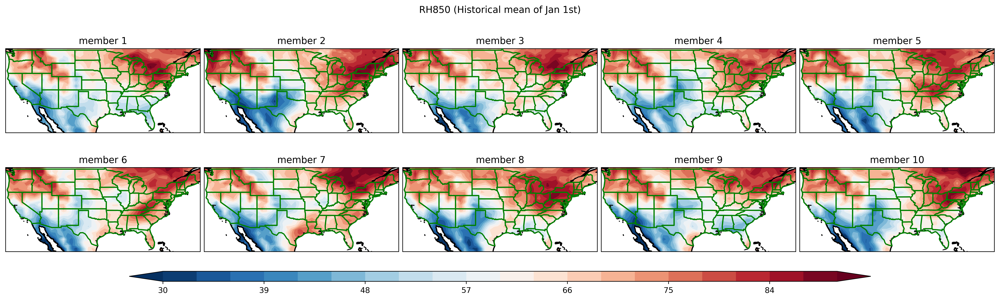

In [8]:
level_1d = [np.linspace(0, 300, 21),
           np.linspace(0, 3000, 21),
           np.linspace(0, 20, 21),
           np.linspace(20, 35, 21),
           np.linspace(25, 45, 21),
           np.linspace(30, 90, 21)]

for nv in range(data_4d.shape[3]):
    plot_p10(ds.lat, ds.lon, data_4d[:,:,:,nv], 'RdBu_r', level_1d[nv], str(ds.variable[nv].values) + ' (Historical mean of Jan 1st)')
